This section trains the ResNet-based classifier using the spectrogram image dataset. We use a validation split to monitor model performance and apply early stopping to avoid overfitting. The best model is saved based on validation loss.

# Split

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from torchvision import transforms
from PIL import Image
from torch.utils.data import Dataset

# Modeling

In [ ]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import torch
from sklearn.model_selection import train_test_split

# Split 70% train, 15% val, 15% test
train_df, temp_df = train_test_split(dataset, test_size=0.30, random_state=42, stratify=dataset['label'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42, stratify=temp_df['label'])


# --- Transforms ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- Dataset class ---
class IMG_DATA(Dataset):
    def __init__(self, df, transform=None):
        self.data = df
        self.transform = transform or transforms.ToTensor()
        self.label_map = {'NONPD': 0, 'PD': 1}

    def __getitem__(self, index):
        img_path = self.data.iloc[index].path
        label_str = self.data.iloc[index].label
        label = self.label_map[label_str]

        image = Image.open(img_path).convert('RGB')
        image = self.transform(image)
        return image, torch.tensor(label, dtype=torch.long)

    def __len__(self):
        return len(self.data)

# --- DataLoaders ---
batch_size = 16

train_dataset = IMG_DATA(train_df, transform=transform)
val_dataset   = IMG_DATA(val_df,   transform=transform)
test_dataset  = IMG_DATA(test_df,  transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader   = DataLoader(val_dataset,   batch_size=batch_size, shuffle=False, num_workers=4)
test_loader  = DataLoader(test_dataset,  batch_size=batch_size, shuffle=False, num_workers=4)

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

class ResNet18Classifier(nn.Module):
    def __init__(self, num_classes: int = 2, dropout: float = 0.3):
        super().__init__()
        # load pretrained backbone
        self.backbone = models.resnet18(pretrained=True)
        in_features = self.backbone.fc.in_features

        # replace the FC head
        self.backbone.fc = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.backbone(x)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import random_split, DataLoader

# Assuming model, criterion, optimizer, train_dataset are already defined

# Config
# --- instantiation ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ResNet18Classifier(num_classes=2, dropout=0.3).to(device)

# --- loss, optimizer, scheduler ---
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
                                                       factor=0.5, patience=3, verbose=True)
# --- Early stopping params ---
patience = 5
best_val_loss = float('inf')
epochs_no_improve = 0
n_epochs = 50

# --- Training loop ---
for epoch in range(1, n_epochs+1):
    # --- Train ---
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)

    train_loss = running_loss / len(train_loader.dataset)

    # --- Validate ---
    model.eval()
    val_loss = 0.0
    correct = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()

    val_loss /= len(val_loader.dataset)
    val_acc = correct / len(val_loader.dataset)

    # Scheduler step
    scheduler.step(val_loss)

    print(f"Epoch {epoch:02d}: "
          f"Train Loss: {train_loss:.4f}  "
          f"Val Loss: {val_loss:.4f}  "
          f"Val Acc: {val_acc:.4f}")

    # --- Early stopping check ---
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0
        # Save best model
        torch.save(model.state_dict(), "best_resnet18.pth")
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

# --- Testing with best model ---
model.load_state_dict(torch.load("best_resnet18.pth"))
model.eval()
test_loss = 0.0
correct = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        test_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()

test_loss /= len(test_loader.dataset)
test_acc = correct / len(test_loader.dataset)
print(f"Test Loss: {test_loss:.4f}  Test Acc: {test_acc:.4f}")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 102MB/s]


Epoch 01: Train Loss: 0.5848  Val Loss: 0.5500  Val Acc: 0.7143
Epoch 02: Train Loss: 0.3199  Val Loss: 0.4810  Val Acc: 0.7143
Epoch 03: Train Loss: 0.1483  Val Loss: 0.3799  Val Acc: 0.7143
Epoch 04: Train Loss: 0.1199  Val Loss: 0.2641  Val Acc: 0.9286
Epoch 05: Train Loss: 0.0883  Val Loss: 0.1676  Val Acc: 0.9286
Epoch 06: Train Loss: 0.0352  Val Loss: 0.1345  Val Acc: 0.9286
Epoch 07: Train Loss: 0.0241  Val Loss: 0.1169  Val Acc: 0.9286
Epoch 08: Train Loss: 0.0181  Val Loss: 0.0962  Val Acc: 0.9286
Epoch 09: Train Loss: 0.0152  Val Loss: 0.0796  Val Acc: 0.9286
Epoch 10: Train Loss: 0.0160  Val Loss: 0.0603  Val Acc: 1.0000
Epoch 11: Train Loss: 0.0085  Val Loss: 0.0483  Val Acc: 1.0000
Epoch 12: Train Loss: 0.0071  Val Loss: 0.0407  Val Acc: 1.0000
Epoch 13: Train Loss: 0.0089  Val Loss: 0.0364  Val Acc: 1.0000
Epoch 14: Train Loss: 0.0065  Val Loss: 0.0316  Val Acc: 1.0000
Epoch 15: Train Loss: 0.0049  Val Loss: 0.0279  Val Acc: 1.0000
Epoch 16: Train Loss: 0.0071  Val Loss: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# --- Evaluate on Validation Set ---
model.eval()
val_preds, val_labels = [], []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        val_preds.extend(preds.cpu().numpy())
        val_labels.extend(labels.numpy())

print("Validation Classification Report:")
print(classification_report(val_labels, val_preds))

Validation Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         8
           1       1.00      1.00      1.00         6

    accuracy                           1.00        14
   macro avg       1.00      1.00      1.00        14
weighted avg       1.00      1.00      1.00        14



In [ ]:
# Load best model
model.load_state_dict(torch.load("best_resnet18.pth"))
model.eval()

# Collect predictions and true labels
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

# Convert to arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Generate classification report
target_names = ['NONPD', 'PD']
print("Test Classification Report:")
print(classification_report(all_labels, all_preds, target_names=target_names))

Test Classification Report:
              precision    recall  f1-score   support

       NONPD       1.00      1.00      1.00         8
          PD       1.00      1.00      1.00         6

    accuracy                           1.00        14
   macro avg       1.00      1.00      1.00        14
weighted avg       1.00      1.00      1.00        14



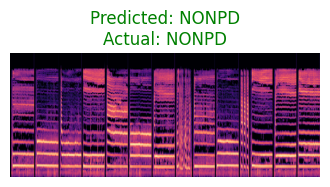

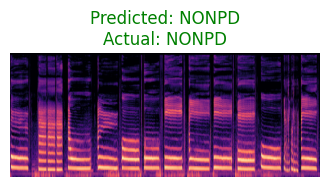

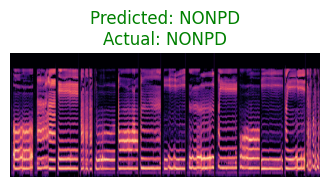

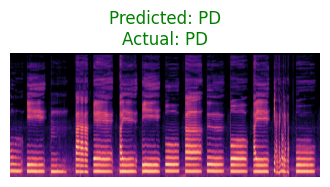

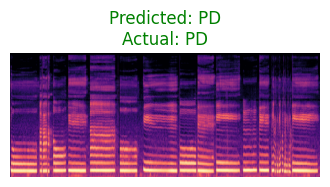

...

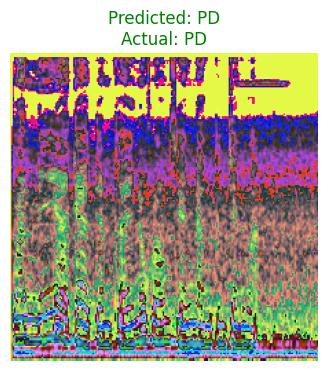

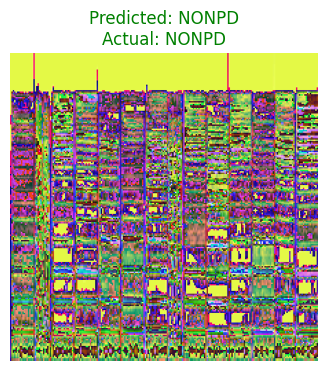

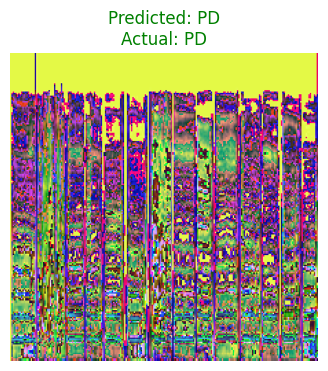

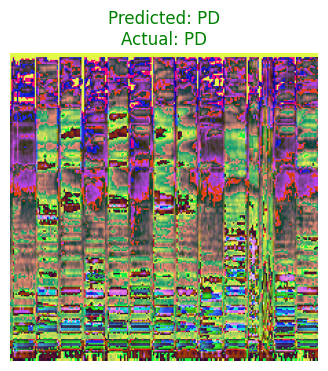

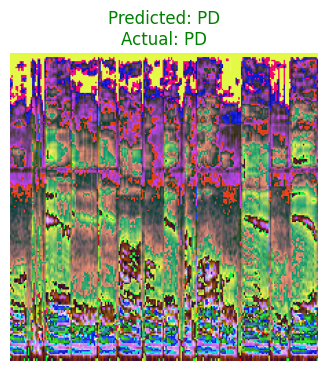

In [ ]:
import matplotlib.pyplot as plt
import torch
from torchvision.transforms.functional import to_pil_image

# Make sure model is in evaluation mode
model.load_state_dict(torch.load("best_resnet18.pth"))
model.eval()

target_names = ['NONPD', 'PD']
shown = 0
max_to_show = 20

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        for i in range(images.size(0)):
            if shown >= max_to_show:
                break

            image = to_pil_image(images[i].cpu())
            pred_label = preds[i].item()
            true_label = labels[i].item()

            plt.figure(figsize=(4, 4))
            plt.imshow(image)
            plt.axis('off')
            title_text = f"Predicted: {target_names[pred_label]}\nActual: {target_names[true_label]}"
            title_color = "green" if pred_label == true_label else "red"
            plt.title(title_text, color=title_color)
            plt.show()
            plt.close()

            shown += 1
        if shown >= max_to_show:
            break
